# **MOUNTING TO GOOGLE DRIVE - DATASET**
Dataset Link: https://www.kaggle.com/datasets/gpiosenka/coffee-bean-dataset-resized-224-x-224

Ontoum, S., Khemanantakul, T., Sroison, P., Triyason, T., & Watanapa, B. (2022). Coffee Roast Intelligence. arXiv preprint arXiv:2206.01841.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Directly point to train and test folders
data_path = '/content/drive/MyDrive/BIGDATA/'

Mounted at /content/drive


# **PREPROCESSING**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

base_dir = data_path

# Normalize pixel values
datagen = ImageDataGenerator(rescale=1./255)

train_generator = datagen.flow_from_directory(
    base_dir + 'train/',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

test_generator = datagen.flow_from_directory(
    base_dir + 'test/',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

Found 1199 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


In [ ]:
print(train_generator.class_indices)

{'Dark': 0, 'Green': 1, 'Light': 2, 'Medium': 3}


# **NOISES ADDITION - VISUALISATION AND FEATURE ANALYSIS**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
COFFEE BEAN PREPROCESSING & FEATURE EXTRACTION
Loaded Green roast sample: green (203).png
Loaded Light roast sample: light (185).png
Loaded Medium roast sample: medium (105).png
Loaded Dark roast sample: dark (15).png
Starting preprocessing demonstration...


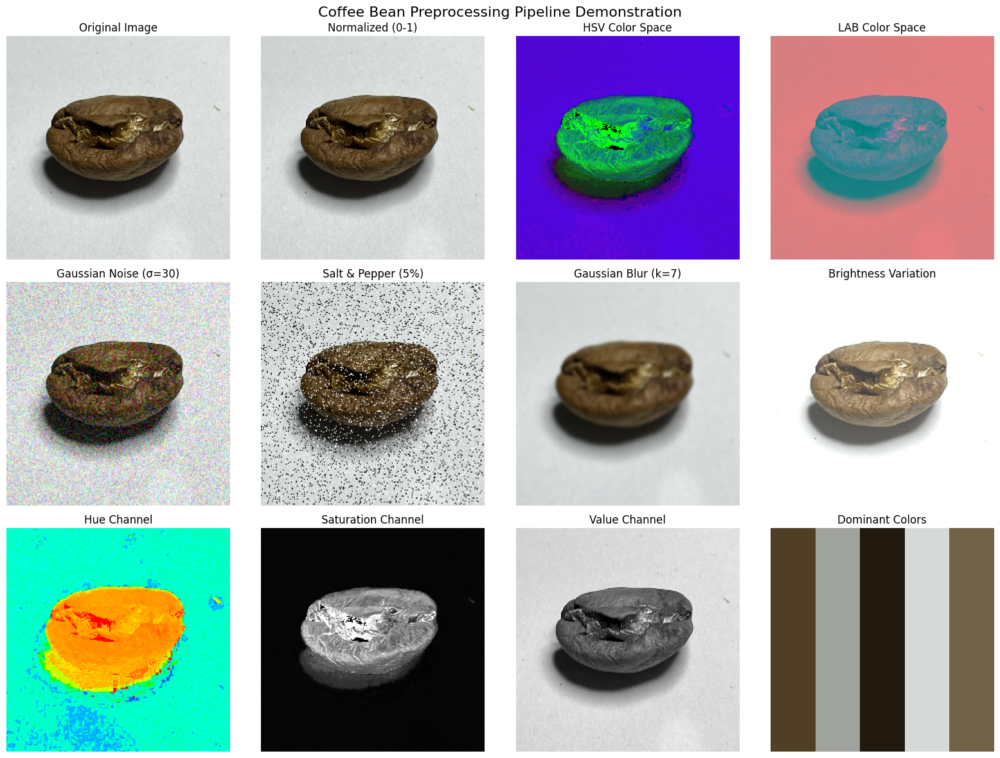

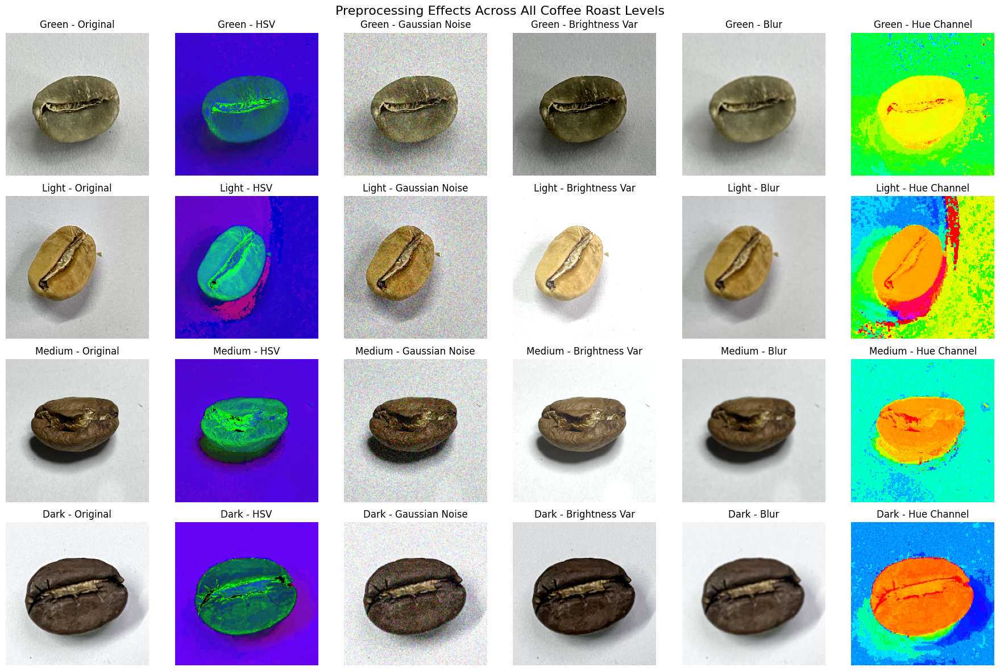


=== COLOR FEATURE ANALYSIS ===

Color Feature Comparison Across Roast Levels:
  Roast_Level  RGB_R_Mean  RGB_G_Mean  RGB_B_Mean  HSV_H_Mean  HSV_S_Mean  \
0       Green      170.92      171.40      161.09       46.09       27.53   
1       Light      181.32      177.05      164.47       52.17       34.58   
2      Medium      177.67      177.75      171.50       66.23       34.80   
3        Dark      180.44      177.78      174.77       73.57       34.29   

   HSV_V_Mean  LAB_L_Mean  LAB_A_Mean  LAB_B_Mean  Histogram_Mean  \
0      172.91      176.83      126.04      133.60            0.06   
1      182.98      183.95      128.24      135.29            0.06   
2      181.31      181.74      127.36      131.60            0.06   
3      183.39      181.53      128.88      130.41            0.06   

   Histogram_Std  Dominant_R  Dominant_G  Dominant_B  
0           0.08      150.33      149.67      135.67  
1           0.11      162.33      152.33      128.67  
2           0.13      13

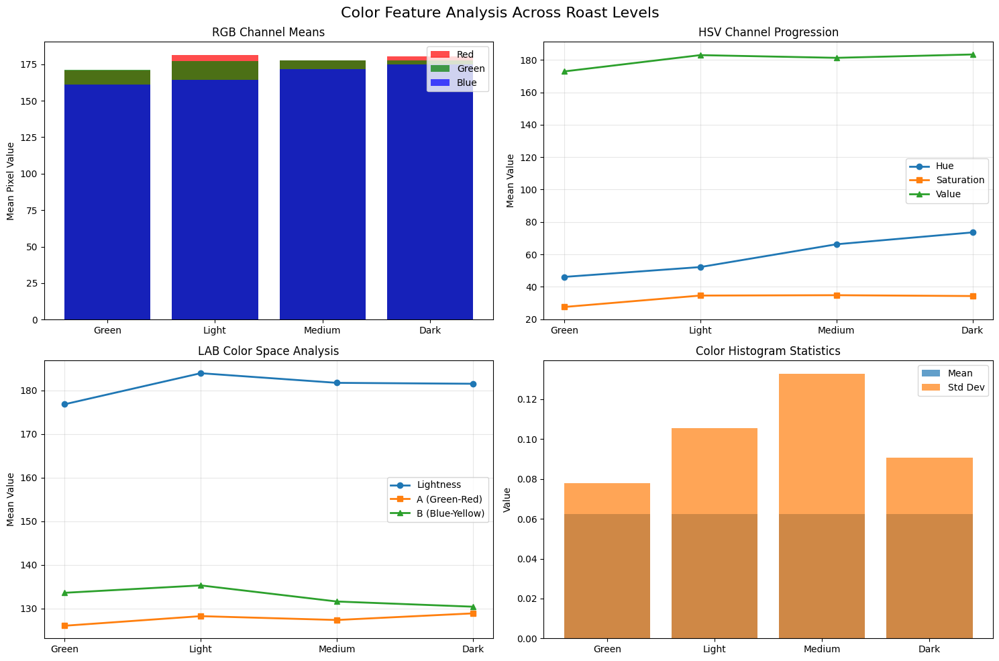

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import seaborn as sns
from google.colab import drive
import os
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Mount drive and set path
drive.mount('/content/drive')
data_path = '/content/drive/MyDrive/BIGDATA/'

print("COFFEE BEAN PREPROCESSING & FEATURE EXTRACTION")

#Loading sample images from the dataset

def load_sample_images():
    """Load one sample image from each coffee roast class"""
    sample_images = {}
    class_paths = {
        'Green': 'train/Green/',
        'Light': 'train/Light/',
        'Medium': 'train/Medium/',
        'Dark': 'train/Dark/'
    }

    for class_name, path in class_paths.items():
        full_path = data_path + path
        if os.path.exists(full_path):
            # Get first image from each class
            image_files = [f for f in os.listdir(full_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            if image_files:
                img_path = os.path.join(full_path, image_files[0])
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
                img = cv2.resize(img, (224, 224))  # Resize to standard size
                sample_images[class_name] = img
                print(f"Loaded {class_name} roast sample: {image_files[0]}")

    return sample_images

sample_images = load_sample_images()

# Basic Preprocessing steps

def denormalize_for_display(image):
    """Convert normalized image back for display"""
    return np.clip(image * 255, 0, 255).astype(np.uint8)

# Noise introduction functions

def normalize_image(image):
    """Normalize pixel values to [0,1] range"""
    return image.astype(np.float32) / 255.0

def add_gaussian_noise(image, sigma=25):
    img = normalize_image(image)
    noise = np.random.normal(0, sigma/255.0, img.shape).astype(np.float32)
    noisy_image = np.clip(img + noise, 0, 1)
    return noisy_image

def add_salt_pepper_noise(image, amount=0.05):
    img = normalize_image(image).copy()
    row, col, ch = img.shape
    num_salt = np.ceil(amount * img.size * 0.5)
    coords = [np.random.randint(0, i-1, int(num_salt)) for i in (row, col)]
    img[coords[0], coords[1], :] = 1.0   # salt

    num_pepper = np.ceil(amount * img.size * 0.5)
    coords = [np.random.randint(0, i-1, int(num_pepper)) for i in (row, col)]
    img[coords[0], coords[1], :] = 0.0   # pepper

    return img

def add_blur_noise(image, kernel_size=5):
    img = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    return normalize_image(img)

def add_brightness_variation(image, brightness_factor=0.3):
    img = normalize_image(image)
    brightness_change = np.random.uniform(-brightness_factor, brightness_factor)
    bright_image = np.clip(img + brightness_change, 0, 1)
    return bright_image

# Feature Extractions

def convert_to_hsv(image):
    """Convert RGB to HSV color space"""
    return cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

def convert_to_lab(image):
    """Convert RGB to LAB color space"""
    return cv2.cvtColor(image, cv2.COLOR_RGB2LAB)

def extract_color_histogram(image, bins=32):
    """Extract color histogram features"""
    # Calculate histogram for each channel
    hist_r = cv2.calcHist([image], [0], None, [bins], [0, 256])
    hist_g = cv2.calcHist([image], [1], None, [bins], [0, 256])
    hist_b = cv2.calcHist([image], [2], None, [bins], [0, 256])

    # Normalize histograms
    hist_r = hist_r.flatten() / np.sum(hist_r)
    hist_g = hist_g.flatten() / np.sum(hist_g)
    hist_b = hist_b.flatten() / np.sum(hist_b)

    return np.concatenate([hist_r, hist_g, hist_b])

def extract_dominant_colors(image, k=3):
    """Extract dominant colors using K-means"""
    data = image.reshape((-1, 3))
    data = np.float32(data)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0)
    _, labels, centers = cv2.kmeans(data, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    return centers.astype(np.uint8)

# Visual Demonstration for Pre-processing steps

def demonstrate_preprocessing_pipeline():
    """Show visual impact of each preprocessing step"""
    if not sample_images:
        print("No sample images loaded!")
        return

    # Take one sample image (let's use Medium roast)
    sample_img = sample_images['Medium']

    # Create figure with subplots
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.suptitle('Coffee Bean Preprocessing Pipeline Demonstration', fontsize=16)

    # Row 1: Original and basic preprocessing
    axes[0,0].imshow(sample_img)
    axes[0,0].set_title('Original Image')
    axes[0,0].axis('off')

    normalized_img = normalize_image(sample_img)
    axes[0,1].imshow(normalized_img)
    axes[0,1].set_title('Normalized (0-1)')
    axes[0,1].axis('off')

    hsv_img = convert_to_hsv(sample_img)
    axes[0,2].imshow(hsv_img)
    axes[0,2].set_title('HSV Color Space')
    axes[0,2].axis('off')

    lab_img = convert_to_lab(sample_img)
    axes[0,3].imshow(lab_img)
    axes[0,3].set_title('LAB Color Space')
    axes[0,3].axis('off')

    # Row 2: Different types of noise
    gaussian_noisy = add_gaussian_noise(sample_img, sigma=30)
    axes[1,0].imshow(gaussian_noisy)
    axes[1,0].set_title('Gaussian Noise (σ=30)')
    axes[1,0].axis('off')

    sp_noisy = add_salt_pepper_noise(sample_img, amount=0.05)
    axes[1,1].imshow(sp_noisy)
    axes[1,1].set_title('Salt & Pepper (5%)')
    axes[1,1].axis('off')

    blurred = add_blur_noise(sample_img, kernel_size=7)
    axes[1,2].imshow(blurred)
    axes[1,2].set_title('Gaussian Blur (k=7)')
    axes[1,2].axis('off')

    bright_varied = add_brightness_variation(sample_img, brightness_factor=0.4)
    axes[1,3].imshow(bright_varied)
    axes[1,3].set_title('Brightness Variation')
    axes[1,3].axis('off')

    # Row 3: Feature extraction visualization
    # Show individual HSV channels
    hsv_channels = cv2.split(hsv_img)
    axes[2,0].imshow(hsv_channels[0], cmap='hsv')
    axes[2,0].set_title('Hue Channel')
    axes[2,0].axis('off')

    axes[2,1].imshow(hsv_channels[1], cmap='gray')
    axes[2,1].set_title('Saturation Channel')
    axes[2,1].axis('off')

    axes[2,2].imshow(hsv_channels[2], cmap='gray')
    axes[2,2].set_title('Value Channel')
    axes[2,2].axis('off')

    # Show dominant colors
    dominant_colors = extract_dominant_colors(sample_img, k=5)
    color_palette = np.ones((100, 100, 3), dtype=np.uint8)
    for i, color in enumerate(dominant_colors):
        start_x = i * 20
        end_x = (i + 1) * 20
        color_palette[:, start_x:end_x] = color

    axes[2,3].imshow(color_palette)
    axes[2,3].set_title('Dominant Colors')
    axes[2,3].axis('off')

    plt.tight_layout()
    plt.show()

# Comparison for the different noise levels

def compare_all_roast_levels():
    """Compare preprocessing effects across all roast levels"""
    if len(sample_images) < 4:
        print("Need all 4 roast level samples!")
        return

    fig, axes = plt.subplots(4, 6, figsize=(18, 12))
    fig.suptitle('Preprocessing Effects Across All Coffee Roast Levels', fontsize=16)

    roast_levels = ['Green', 'Light', 'Medium', 'Dark']

    for i, roast_level in enumerate(roast_levels):
        if roast_level not in sample_images:
            continue

        img = sample_images[roast_level]

        # Original
        axes[i,0].imshow(img)
        axes[i,0].set_title(f'{roast_level} - Original')
        axes[i,0].axis('off')

        # HSV
        hsv_img = convert_to_hsv(img)
        axes[i,1].imshow(hsv_img)
        axes[i,1].set_title(f'{roast_level} - HSV')
        axes[i,1].axis('off')

        # Gaussian Noise
        noisy = add_gaussian_noise(img, sigma=25)
        axes[i,2].imshow(noisy)
        axes[i,2].set_title(f'{roast_level} - Gaussian Noise')
        axes[i,2].axis('off')

        # Brightness variation
        bright = add_brightness_variation(img, brightness_factor=0.3)
        axes[i,3].imshow(bright)
        axes[i,3].set_title(f'{roast_level} - Brightness Var')
        axes[i,3].axis('off')

        # Blur
        blurred = add_blur_noise(img, kernel_size=5)
        axes[i,4].imshow(blurred)
        axes[i,4].set_title(f'{roast_level} - Blur')
        axes[i,4].axis('off')

        # Hue channel only
        hue_channel = cv2.split(hsv_img)[0]
        axes[i,5].imshow(hue_channel, cmap='hsv')
        axes[i,5].set_title(f'{roast_level} - Hue Channel')
        axes[i,5].axis('off')

    plt.tight_layout()
    plt.show()

# Color Analysis

def analyze_color_features():
    """Analyze color features across different roast levels"""
    print("\n=== COLOR FEATURE ANALYSIS ===")

    features_data = []

    for roast_level, img in sample_images.items():
        # Convert to different color spaces
        hsv_img = convert_to_hsv(img)
        lab_img = convert_to_lab(img)

        # Extract features
        rgb_mean = np.mean(img, axis=(0,1))
        hsv_mean = np.mean(hsv_img, axis=(0,1))
        lab_mean = np.mean(lab_img, axis=(0,1))

        # Color histogram
        color_hist = extract_color_histogram(img, bins=16)
        hist_mean = np.mean(color_hist)
        hist_std = np.std(color_hist)

        # Dominant colors
        dominant_colors = extract_dominant_colors(img, k=3)
        dominant_mean = np.mean(dominant_colors, axis=0)

        features_data.append({
            'Roast_Level': roast_level,
            'RGB_R_Mean': rgb_mean[0],
            'RGB_G_Mean': rgb_mean[1],
            'RGB_B_Mean': rgb_mean[2],
            'HSV_H_Mean': hsv_mean[0],
            'HSV_S_Mean': hsv_mean[1],
            'HSV_V_Mean': hsv_mean[2],
            'LAB_L_Mean': lab_mean[0],
            'LAB_A_Mean': lab_mean[1],
            'LAB_B_Mean': lab_mean[2],
            'Histogram_Mean': hist_mean,
            'Histogram_Std': hist_std,
            'Dominant_R': dominant_mean[0],
            'Dominant_G': dominant_mean[1],
            'Dominant_B': dominant_mean[2]
        })

    # Create DataFrame
    df = pd.DataFrame(features_data)

    # Display feature comparison
    print("\nColor Feature Comparison Across Roast Levels:")
    print("=" * 60)
    print(df.round(2))

    # Visualize key features
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('Color Feature Analysis Across Roast Levels', fontsize=16)

    # RGB means
    axes[0,0].bar(df['Roast_Level'], df['RGB_R_Mean'], alpha=0.7, color='red', label='Red')
    axes[0,0].bar(df['Roast_Level'], df['RGB_G_Mean'], alpha=0.7, color='green', label='Green')
    axes[0,0].bar(df['Roast_Level'], df['RGB_B_Mean'], alpha=0.7, color='blue', label='Blue')
    axes[0,0].set_title('RGB Channel Means')
    axes[0,0].set_ylabel('Mean Pixel Value')
    axes[0,0].legend()

    # HSV means
    axes[0,1].plot(df['Roast_Level'], df['HSV_H_Mean'], marker='o', label='Hue', linewidth=2)
    axes[0,1].plot(df['Roast_Level'], df['HSV_S_Mean'], marker='s', label='Saturation', linewidth=2)
    axes[0,1].plot(df['Roast_Level'], df['HSV_V_Mean'], marker='^', label='Value', linewidth=2)
    axes[0,1].set_title('HSV Channel Progression')
    axes[0,1].set_ylabel('Mean Value')
    axes[0,1].legend()
    axes[0,1].grid(True, alpha=0.3)

    # LAB means
    axes[1,0].plot(df['Roast_Level'], df['LAB_L_Mean'], marker='o', label='Lightness', linewidth=2)
    axes[1,0].plot(df['Roast_Level'], df['LAB_A_Mean'], marker='s', label='A (Green-Red)', linewidth=2)
    axes[1,0].plot(df['Roast_Level'], df['LAB_B_Mean'], marker='^', label='B (Blue-Yellow)', linewidth=2)
    axes[1,0].set_title('LAB Color Space Analysis')
    axes[1,0].set_ylabel('Mean Value')
    axes[1,0].legend()
    axes[1,0].grid(True, alpha=0.3)

    # Histogram statistics
    axes[1,1].bar(df['Roast_Level'], df['Histogram_Mean'], alpha=0.7, label='Mean')
    axes[1,1].bar(df['Roast_Level'], df['Histogram_Std'], alpha=0.7, label='Std Dev')
    axes[1,1].set_title('Color Histogram Statistics')
    axes[1,1].set_ylabel('Value')
    axes[1,1].legend()

    plt.tight_layout()
    plt.show()

    return df


# Main execution

print("Starting preprocessing demonstration...")

# Run all demonstrations
demonstrate_preprocessing_pipeline()
compare_all_roast_levels()
feature_df = analyze_color_features()

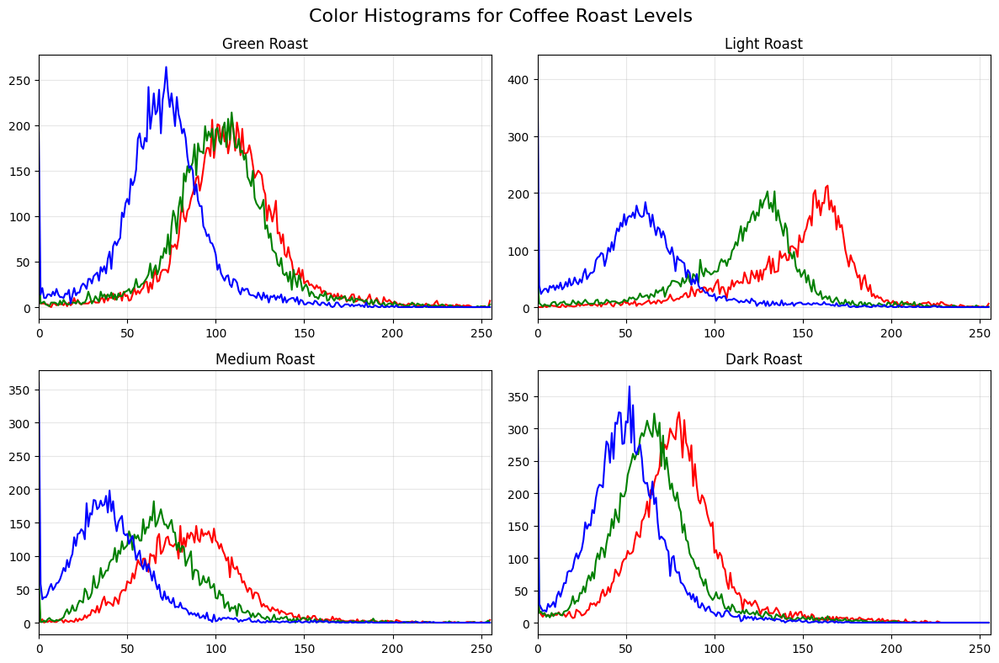

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np

# segmentation function
def segment_coffee_bean(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower = np.array([0, 30, 30])
    upper = np.array([179, 255, 255])
    mask = cv2.inRange(hsv, lower, upper)
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask

# plot histogram for one image using its mask
def plot_color_histogram(image_path, ax, title):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = segment_coffee_bean(img)

    colors = ('r', 'g', 'b')
    for i, col in enumerate(colors):
        hist = cv2.calcHist([img], [i], mask, [256], [0, 256])
        ax.plot(hist, color=col)
        ax.set_xlim([0, 256])
    ax.set_title(title)
    ax.grid(True, alpha=0.3)

# show histograms for all roast levels
def show_all_class_histograms(base_dir):
    roast_levels = ["Green", "Light", "Medium", "Dark"]

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.ravel()

    for i, roast in enumerate(roast_levels):
        roast_folder = os.path.join(base_dir, roast)
        files = [f for f in os.listdir(roast_folder) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        if not files:
            continue

        img_path = os.path.join(roast_folder, files[0])  # pick first image
        plot_color_histogram(img_path, axes[i], f"{roast} Roast")

    plt.suptitle("Color Histograms for Coffee Roast Levels", fontsize=16)
    plt.tight_layout()
    plt.show()

# Example usage
test_dir = "/content/drive/MyDrive/BIGDATA/train"
show_all_class_histograms(test_dir)

# **SEGMENTATION AND FEATURE EXTRACTION**

## **SEGMENTED DATA - CLEAN IMAGES**

In [ ]:
import cv2
import numpy as np
import pandas as pd
import os

# INPUT IMAGE - HSV COLOUR SPACE
def segment_coffee_bean(image):

    """
    Segment coffee bean using HSV color thresholding
    Returns: masked image and binary mask.
    """

    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Define HSV thresholds

    lower = np.array([0, 30, 30])     # lower hue, saturation, value
    upper = np.array([179, 255, 255]) # upper hue, saturation, value

    mask = cv2.inRange(hsv, lower, upper)

    # clean mask using morphology - to clean noises(greying, shadows)
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Masked region
    segmented = cv2.bitwise_and(image, image, mask=mask)
    return segmented, mask

# FEATURE EXTRACTION ON MASKED REGION
def extract_features_from_masked(image, mask):

    """
    Extract color statistics only from masked region.
    """
    masked_pixels = image[mask > 0]  # Only use ROI pixels - to be segmented

    if masked_pixels.size == 0:
        return None  # skip empty mask

    # Mean color values
    mean_rgb = np.mean(masked_pixels, axis=0)
    std_rgb  = np.std(masked_pixels, axis=0)

    # Convert to HSV and LAB for better features
    hsv_img = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hsv_masked_pixels = hsv_img[mask > 0]
    mean_hsv = np.mean(hsv_masked_pixels, axis=0)

    lab_img = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    lab_masked_pixels = lab_img[mask > 0]
    mean_lab = np.mean(lab_masked_pixels, axis=0)

    # Combine all features into one row
    feature_row = {
        "RGB_R_Mean": mean_rgb[0],
        "RGB_G_Mean": mean_rgb[1],
        "RGB_B_Mean": mean_rgb[2],
        "RGB_R_Std": std_rgb[0],
        "RGB_G_Std": std_rgb[1],
        "RGB_B_Std": std_rgb[2],
        "HSV_H_Mean": mean_hsv[0],
        "HSV_S_Mean": mean_hsv[1],
        "HSV_V_Mean": mean_hsv[2],
        "LAB_L_Mean": mean_lab[0],
        "LAB_A_Mean": mean_lab[1],
        "LAB_B_Mean": mean_lab[2],
    }

    return feature_row

# LOOP THROUGH DATASET AND SAVE FEATURES
def process_dataset_and_save(data_path, output_csv="segmented_features_clean.csv"):
    roast_levels = ["Green", "Light", "Medium", "Dark"]
    feature_list = []

    for roast in roast_levels:
        folder = os.path.join(data_path, "train", roast)
        if not os.path.exists(folder):
            continue

        files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        for f in files:  # process first 10 images for speed; remove [:10] to do all
            img_path = os.path.join(folder, f)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (224,224))

            segmented, mask = segment_coffee_bean(img)
            features = extract_features_from_masked(img, mask)

            if features is not None:
                features["Roast_Level"] = roast
                features["Filename"] = f
                feature_list.append(features)

    # Convert to DataFrame
    df = pd.DataFrame(feature_list)
    print(df.head())  # Show first rows in terminal

    # Save to CSV
    save_path = os.path.join(data_path, output_csv)
    df.to_csv(save_path, index=False)
    print(f"\n[INFO] Features saved to: {save_path}")

    return df


segmented_features_df = process_dataset_and_save(data_path)

   RGB_R_Mean  RGB_G_Mean  RGB_B_Mean  RGB_R_Std  RGB_G_Std  RGB_B_Std  \
0  108.571834  102.301525   70.071125  29.890190  29.444681  26.407107   
1  115.529219  104.500885   71.294783  33.750975  32.456699  31.639051   
2  131.726533  117.777421   76.127065  41.326284  40.002455  37.535234   
3  133.497239  119.641686   83.875975  37.953432  38.295598  37.663225   
4   97.291481   91.417762   55.064383  24.411770  23.834179  23.535670   

   HSV_H_Mean  HSV_S_Mean  HSV_V_Mean  LAB_L_Mean  LAB_A_Mean  LAB_B_Mean  \
0   25.154665   96.211600  108.603760  109.299220  125.140564  147.046204   
1   22.685329  104.187304  115.529356  112.576761  127.130091  148.335785   
2   23.011744  115.428012  131.832772  126.192437  127.313630  152.893291   
3   21.679376  103.650714  133.497239  128.407661  127.969410  149.604610   
4   26.140048  116.263741   97.355036   97.840803  124.550357  149.741538   

  Roast_Level         Filename  
0       Green  green (203).png  
1       Green  green (279)

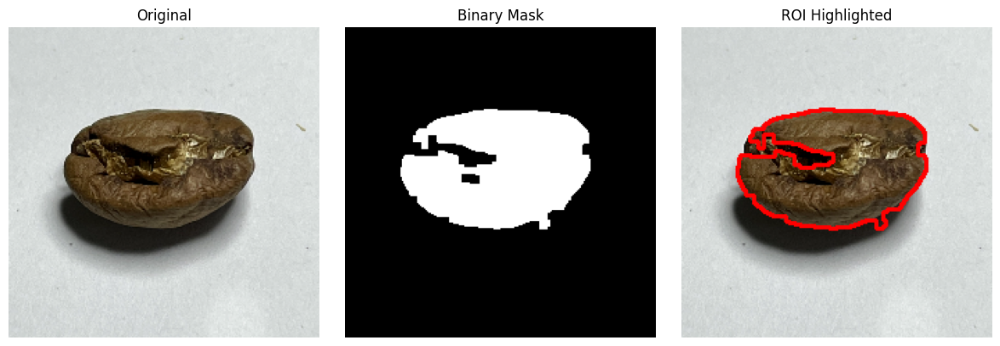

In [ ]:
import matplotlib.pyplot as plt

# Pick one sample image (say from Medium roast)
sample_img_path = os.path.join(data_path, "train", "Medium", os.listdir(os.path.join(data_path, "train", "Medium"))[0])

# Load and preprocess
img = cv2.imread(sample_img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (224, 224))

# Segment
segmented, mask = segment_coffee_bean(img)

# Create ROI overlay: original + mask edges
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
overlay = img.copy()
cv2.drawContours(overlay, contours, -1, (255, 0, 0), 2)  # Blue boundary

# Show results
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(img)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(mask, cmap="gray")
ax[1].set_title("Binary Mask")
ax[1].axis("off")

ax[2].imshow(overlay)
ax[2].set_title("ROI Highlighted")
ax[2].axis("off")

plt.tight_layout()
plt.show()

## **NOISE ADDITION TO IMAGES IN THE DATASET**

In [ ]:
import random

def add_random_noise(image): #To randomly apply any of the noise functions to images
    choice = random.choice(['gaussian', 'sp', 'blur', 'brightness', 'none'])
    if choice == 'gaussian':
        return add_gaussian_noise(image, sigma=25)
    elif choice == 'sp':
        return add_salt_pepper_noise(image, amount=0.05)
    elif choice == 'blur':
        return add_blur_noise(image, kernel_size=5)
    elif choice == 'brightness':
        return add_brightness_variation(image, brightness_factor=0.3)
    else:
        return normalize_image(image)   # no noise

In [ ]:
  datagen = ImageDataGenerator(
      preprocessing_function=add_random_noise
  )

  train_generator = datagen.flow_from_directory(
      base_dir + 'train/',
      target_size=(150, 150),
      batch_size=32,
      class_mode='categorical'
  )

  test_generator = datagen.flow_from_directory(
      base_dir + 'test/',
      target_size=(150, 150),
      batch_size=32,
      class_mode='categorical'
  )

Found 1199 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


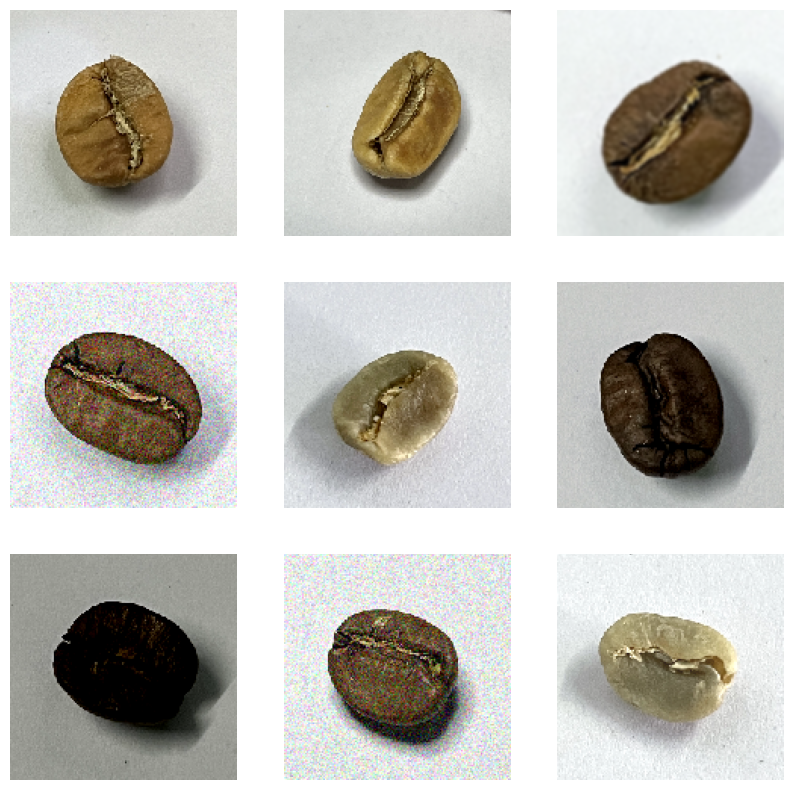

In [ ]:
#To randomly show how the noises are added to each images randomly
x_batch, y_batch = next(train_generator)

import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(x_batch[i])
    plt.axis("off")
plt.show()

## **SEGMENTED IMAGES - NOISE DATA**

In [ ]:
import cv2
import numpy as np
import pandas as pd
import os

# SEGMENTATION FUNCTION USING HSV THRESHOLDING
def segment_coffee_bean(image):
    """
    Segment coffee bean using HSV color thresholding.
    Returns: masked image and binary mask.
    """
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Define HSV thresholds
    lower = np.array([0, 30, 30])     # lower hue, sat, val
    upper = np.array([179, 255, 255]) # upper hue, sat, val

    mask = cv2.inRange(hsv, lower, upper)

    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Masked region
    segmented = cv2.bitwise_and(image, image, mask=mask)
    return segmented, mask

# Feature Extraction
def extract_features_from_masked(image, mask):
    """
    Extract color statistics only from masked region.
    """
    masked_pixels = image[mask > 0]  # Only use ROI pixels

    if masked_pixels.size == 0:
        return None  # skip empty mask

    # Mean color values
    mean_rgb = np.mean(masked_pixels, axis=0)
    std_rgb  = np.std(masked_pixels, axis=0)

    # Convert to HSV and LAB for better features
    hsv_img = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hsv_masked_pixels = hsv_img[mask > 0]
    mean_hsv = np.mean(hsv_masked_pixels, axis=0)

    lab_img = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    lab_masked_pixels = lab_img[mask > 0]
    mean_lab = np.mean(lab_masked_pixels, axis=0)

    # Combine all features into one row
    feature_row = {
        "RGB_R_Mean": mean_rgb[0],
        "RGB_G_Mean": mean_rgb[1],
        "RGB_B_Mean": mean_rgb[2],
        "RGB_R_Std": std_rgb[0],
        "RGB_G_Std": std_rgb[1],
        "RGB_B_Std": std_rgb[2],
        "HSV_H_Mean": mean_hsv[0],
        "HSV_S_Mean": mean_hsv[1],
        "HSV_V_Mean": mean_hsv[2],
        "LAB_L_Mean": mean_lab[0],
        "LAB_A_Mean": mean_lab[1],
        "LAB_B_Mean": mean_lab[2],
    }

    return feature_row

# LOOP THROUGH DATASET AND SAVE FEATURES
def process_dataset_and_save(data_path, output_csv="segmented_features_noisy.csv"):
    roast_levels = ["Green", "Light", "Medium", "Dark"]
    feature_list = []

    for roast in roast_levels:
        folder = os.path.join(data_path, "train", roast)
        if not os.path.exists(folder):
            continue

        files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        for f in files:  # process first 10 images for speed; remove [:10] to do all
            img_path = os.path.join(folder, f)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (224,224))

            segmented, mask = segment_coffee_bean(img)
            features = extract_features_from_masked(img, mask)

            if features is not None:
                features["Roast_Level"] = roast
                features["Filename"] = f
                feature_list.append(features)

    # Convert to DataFrame
    df = pd.DataFrame(feature_list)
    print(df.head())  # Show first rows in terminal

    # Save to CSV
    save_path = os.path.join(data_path, output_csv)
    df.to_csv(save_path, index=False)
    print(f"\n[INFO] Features saved to: {save_path}")

    return df

# EXECUTE
segmented_features_df = process_dataset_and_save(data_path)

   RGB_R_Mean  RGB_G_Mean  RGB_B_Mean  RGB_R_Std  RGB_G_Std  RGB_B_Std  \
0  108.571834  102.301525   70.071125  29.890190  29.444681  26.407107   
1  115.529219  104.500885   71.294783  33.750975  32.456699  31.639051   
2  131.726533  117.777421   76.127065  41.326284  40.002455  37.535234   
3  133.497239  119.641686   83.875975  37.953432  38.295598  37.663225   
4   97.291481   91.417762   55.064383  24.411770  23.834179  23.535670   

   HSV_H_Mean  HSV_S_Mean  HSV_V_Mean  LAB_L_Mean  LAB_A_Mean  LAB_B_Mean  \
0   25.154665   96.211600  108.603760  109.299220  125.140564  147.046204   
1   22.685329  104.187304  115.529356  112.576761  127.130091  148.335785   
2   23.011744  115.428012  131.832772  126.192437  127.313630  152.893291   
3   21.679376  103.650714  133.497239  128.407661  127.969410  149.604610   
4   26.140048  116.263741   97.355036   97.840803  124.550357  149.741538   

  Roast_Level         Filename  
0       Green  green (203).png  
1       Green  green (279)

In [ ]:
import cv2
import numpy as np
import pandas as pd
import os

# --- Segmentation + Feature Extraction ---
def extract_features_from_image(img_path, roast_level):
    img = cv2.imread(img_path)  # BGR
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Grayscale + threshold for segmentation
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)

    # Morphological cleanup
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Segmented region
    masked_pixels = img_rgb[mask == 255]
    if masked_pixels.size == 0:  # skip empty masks
        return None

    mean_rgb = np.mean(masked_pixels, axis=0)

    features = {
        'Roast_Level': roast_level,
        'Filename': os.path.basename(img_path),
        'Mean_R': mean_rgb[0],
        'Mean_G': mean_rgb[1],
        'Mean_B': mean_rgb[2],
        'Mask_Area': np.sum(mask == 255)
    }
    return features

# Process full test dataset
def process_test_dataset(base_dir, output_csv="test_features.csv"):
    roast_levels = ["Dark", "Green", "Light", "Medium"]
    feature_list = []

    for roast in roast_levels:
        folder = os.path.join(base_dir, roast)
        if not os.path.exists(folder):
            continue

        files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.jpeg','.png'))]
        for f in files:
            img_path = os.path.join(folder, f)
            features = extract_features_from_image(img_path, roast)
            if features is not None:
                feature_list.append(features)

    df = pd.DataFrame(feature_list)
    save_path = os.path.join(base_dir, output_csv)
    df.to_csv(save_path, index=False)
    print(f"[INFO] Features saved to: {save_path}")
    print(df.head())
    return df

# Run
test_dir = "/content/drive/MyDrive/BIGDATA/test"
df_test = process_test_dataset(test_dir, output_csv="segmented_features_test_masked.csv")

[INFO] Features saved to: /content/drive/MyDrive/BIGDATA/test/segmented_features_test_masked.csv
  Roast_Level       Filename     Mean_R     Mean_G     Mean_B  Mask_Area
0        Dark   dark (8).png  57.124867  48.724242  38.729553      16946
1        Dark   dark (7).png  67.780148  51.107838  33.311731      13409
2        Dark  dark (73).png  63.263097  54.661050  46.862278      14660
3        Dark  dark (28).png  68.705016  53.220223  36.252468      12560
4        Dark  dark (95).png  51.838668  43.571937  35.756547       9279


# **CLASSIFICATION**

## **DEEP LEARNING WITH CNN**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')  # 4 roast levels
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,828,868 (18.42 MB)

 Trainable params: 4,828,868 (18.42 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=10
)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.2996 - loss: 1.4796 - val_accuracy: 0.8250 - val_loss: 0.7158
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.7263 - loss: 0.7378 - val_accuracy: 0.9225 - val_loss: 0.2451
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8578 - loss: 0.3968 - val_accuracy: 0.9025 - val_loss: 0.2774
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.8988 - loss: 0.2819 - val_accuracy: 0.9375 - val_loss: 0.1736
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.9010 - loss: 0.3031 - val_accuracy: 0.8950 - val_loss: 0.3192
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.8813 - loss: 0.3255 - val_accuracy: 0.9425 - val_loss: 0.1720
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.9307 - loss: 0.1694 - val_accuracy: 0.9575 - val_loss: 0.1011
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9592 - loss: 0.1284 - val_accuracy: 0.9625 - val_loss:

In [ ]:
print(train_generator.class_indices)

{'Dark': 0, 'Green': 1, 'Light': 2, 'Medium': 3}


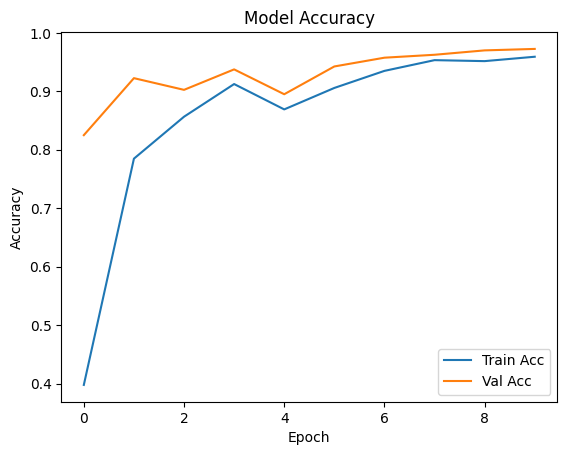

In [ ]:
# Plot training history
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.legend()
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

# **PREDICIONS**

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image

# Load the image you want to test
img_path = '/content/drive/MyDrive/BIGDATA/test/Green/green (21).png'
img = image.load_img(img_path, target_size=(150, 150))  # resize to model's expected input

# Convert the image to array and normalize pixel values
img_array = image.img_to_array(img) / 255.0

# Add a batch dimension since model expects batches
img_array = np.expand_dims(img_array, axis=0)  # shape (1, 150, 150, 3)

# Predict the class probabilities
predictions = model.predict(img_array)

# Get the index of the highest probability
predicted_class_index = np.argmax(predictions[0])

# Map the index to the class label using your actual class labels
class_labels = ['Dark', 'Green', 'Light', 'Medium']
predicted_label = class_labels[predicted_class_index]

print(f"Predicted roast level: {predicted_label}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Predicted roast level: Green


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


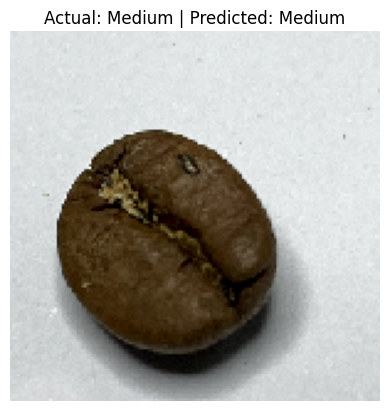

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Load the image you want to test
img_path = '/content/drive/MyDrive/BIGDATA/test/Medium/medium (13).png'
img = image.load_img(img_path, target_size=(150, 150))  # resize to model's expected input

# Convert the image to array and normalize pixel values
img_array = image.img_to_array(img) / 255.0

# Add a batch dimension since model expects batches
img_array_expanded = np.expand_dims(img_array, axis=0)  # shape (1, 150, 150, 3)

# Predict the class probabilities
predictions = model.predict(img_array_expanded)
predicted_class_index = np.argmax(predictions[0])

# Your class labels
class_labels = ['Dark', 'Green', 'Light', 'Medium']

# Extract the true label from the file path (assuming folder name is the label)
# For example, '/content/drive/MyDrive/BIGDATA/test/Medium/medium (13).png' -> 'Medium'
actual_label = img_path.split('/')[-2]

predicted_label = class_labels[predicted_class_index]

# Plot the image with actual and predicted labels
plt.imshow(img)
plt.title(f"Actual: {actual_label} | Predicted: {predicted_label}")
plt.axis('off')
plt.show()

## **REPRESENTATION OF HOW FEATURES DIFFER FOR EACH TEST DATA**

In [ ]:
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.preprocessing import image

# Load image
img_path = '/content/drive/MyDrive/BIGDATA/test/Light/light (11).png'
img = cv2.imread(img_path)  # BGR format
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Simple segmentation example: Threshold based on color (modify thresholds as needed)
# Let's say coffee beans are darker, so threshold by intensity
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)  # invert to get dark regions

# Optional: Morphological operations to clean mask
kernel = np.ones((5,5), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# Extract the segmented region using the mask
segmented = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

# Feature Extraction from segmented region

# 1. Mask pixels only (flatten masked pixels)
masked_pixels = img_rgb[mask == 255]

# 2. Calculate mean RGB values as features
mean_rgb = np.mean(masked_pixels, axis=0)  # [R_mean, G_mean, B_mean]

# 3. Other features can be added here...

# Prepare data for saving
features = {
    'Mean_R': mean_rgb[0],
    'Mean_G': mean_rgb[1],
    'Mean_B': mean_rgb[2],
    'Mask_Area': np.sum(mask == 255)
}

# Convert to DataFrame for saving or printing
df = pd.DataFrame([features])

# Save to CSV
csv_path = '/content/drive/MyDrive/BIGDATA/features_lgt.csv'
df.to_csv(csv_path, index=False)

print("Extracted features:")
print(df)
print(f"Features saved to: {csv_path}")

Extracted features:
      Mean_R     Mean_G     Mean_B  Mask_Area
0  81.266524  67.144695  35.831904       5598
Features saved to: /content/drive/MyDrive/BIGDATA/features_lgt.csv


In [ ]:
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.preprocessing import image

# Load image
img_path = '/content/drive/MyDrive/BIGDATA/test/Medium/medium (13).png'
img = cv2.imread(img_path)  # BGR format
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Simple segmentation example: Threshold based on color (modify thresholds as needed)
# Let's say coffee beans are darker, so threshold by intensity
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)  # invert to get dark regions

# Optional: Morphological operations to clean mask
kernel = np.ones((5,5), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# Extract the segmented region using the mask
segmented = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

# Feature Extraction from segmented region

# 1. Mask pixels only (flatten masked pixels)
masked_pixels = img_rgb[mask == 255]

# 2. Calculate mean RGB values as features
mean_rgb = np.mean(masked_pixels, axis=0)  # [R_mean, G_mean, B_mean]

# 3. Other features can be added here...

# Prepare data for saving
features = {
    'Mean_R': mean_rgb[0],
    'Mean_G': mean_rgb[1],
    'Mean_B': mean_rgb[2],
    'Mask_Area': np.sum(mask == 255)
}

# Convert to DataFrame for saving or printing
df = pd.DataFrame([features])

# Save to CSV
csv_path = '/content/drive/MyDrive/BIGDATA/features_med.csv'
df.to_csv(csv_path, index=False)

print("Extracted features:")
print(df)
print(f"Features saved to: {csv_path}")

Extracted features:
      Mean_R     Mean_G     Mean_B  Mask_Area
0  62.632881  46.516643  23.972915      15322
Features saved to: /content/drive/MyDrive/BIGDATA/features_med.csv


In [ ]:
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.preprocessing import image

# Load image
img_path = '/content/drive/MyDrive/BIGDATA/test/Dark/dark (16).png'
img = cv2.imread(img_path)  # BGR format
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Simple segmentation example: Threshold based on color (modify thresholds as needed)
# Let's say coffee beans are darker, so threshold by intensity
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, mask = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY_INV)  # invert to get dark regions

# Optional: Morphological operations to clean mask
kernel = np.ones((5,5), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# Extract the segmented region using the mask
segmented = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

# Feature Extraction from segmented region

# 1. Mask pixels only (flatten masked pixels)
masked_pixels = img_rgb[mask == 255]

# 2. Calculate mean RGB values as features
mean_rgb = np.mean(masked_pixels, axis=0)  # [R_mean, G_mean, B_mean]

# 3. Other features can be added here...

# Prepare data for saving
features = {
    'Mean_R': mean_rgb[0],
    'Mean_G': mean_rgb[1],
    'Mean_B': mean_rgb[2],
    'Mask_Area': np.sum(mask == 255)
}

# Convert to DataFrame for saving or printing
df = pd.DataFrame([features])

# Save to CSV
csv_path = '/content/drive/MyDrive/BIGDATA/features_dark.csv'
df.to_csv(csv_path, index=False)

print("Extracted features:")
print(df)
print(f"Features saved to: {csv_path}")

Extracted features:
      Mean_R     Mean_G     Mean_B  Mask_Area
0  47.853011  40.521178  32.374189      13103
Features saved to: /content/drive/MyDrive/BIGDATA/features_dark.csv


      Mean_R     Mean_G     Mean_B  Mask_Area
0  81.266524  67.144695  35.831904       5598


/tmp/ipython-input-3123999806.py:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Color Channel', y='Mean Intensity', data=df_melted, ci=None)


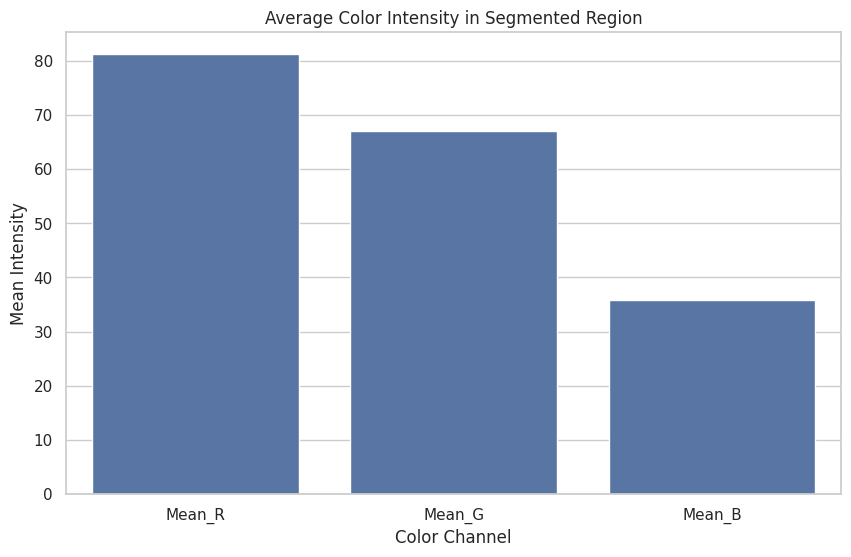

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the features CSV
features_path = '/content/drive/MyDrive/BIGDATA/features_lgt.csv'
df = pd.read_csv(features_path)

# Show the data to understand it
print(df.head())

# Set style for seaborn
sns.set(style="whitegrid")

# 1. Bar plot for Mean RGB values
plt.figure(figsize=(10, 6))
df_melted = df.melt(value_vars=['Mean_R', 'Mean_G', 'Mean_B'], var_name='Color Channel', value_name='Mean Intensity')
sns.barplot(x='Color Channel', y='Mean Intensity', data=df_melted, ci=None)
plt.title('Average Color Intensity in Segmented Region')
plt.show()

# **EVALUATION ON TEST DATA**

Found 400 images belonging to 4 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 284ms/step
CNN Model Evaluation on Test Set:

              precision    recall  f1-score   support

        Dark       0.98      0.95      0.96       100
       Green       1.00      1.00      1.00       100
       Light       1.00      0.99      0.99       100
      Medium       0.94      0.98      0.96       100

    accuracy                           0.98       400
   macro avg       0.98      0.98      0.98       400
weighted avg       0.98      0.98      0.98       400



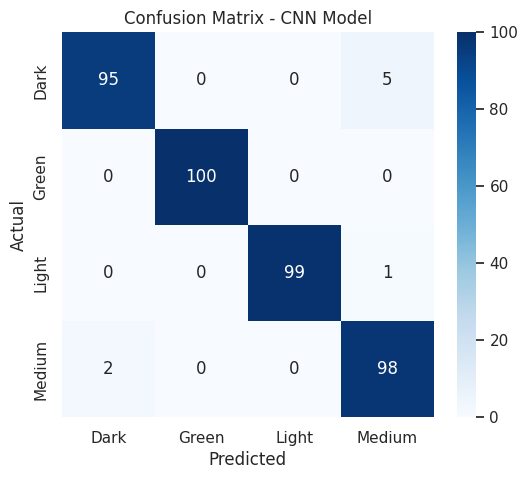

✅ CNN Test Accuracy: 0.98


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path to your test directory
test_dir = "/content/drive/MyDrive/BIGDATA/test"

# 1. Data generator (no augmentation, just rescaling)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),   # must match training size
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# 2. Predictions
y_pred_probs = model.predict(test_generator)   # cnn_model = your trained CNN
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes

# 3. Class labels
class_labels = list(test_generator.class_indices.keys())

# 4. Evaluation
print("CNN Model Evaluation on Test Set:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

# 5. Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CNN Model")
plt.show()

# 6. Test Accuracy
acc = accuracy_score(y_true, y_pred)
print("✅ CNN Test Accuracy:", acc)

# **FINAL OUTPUT**

Button(description='🔄 Classify Another Random Image', style=ButtonStyle())

Output()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128247 (\N{CAMERA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


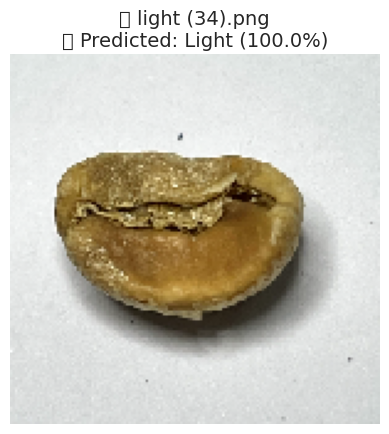

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from IPython.display import display, HTML, clear_output
import ipywidgets as widgets

test_dir = "/content/drive/MyDrive/BIGDATA/test"
class_labels = ['Dark', 'Green', 'Light', 'Medium']  # match your training label order

# Common uses per roast level - From internet
roast_uses = {
    "Green": """
        <ul>
        <li>Home roasting</li>
        <li>Health products</li>
        <li>Storage/trade</li>
        <li>Professional evaluation</li>
        </ul>
    """,
    "Light": """
        <ul>
        <li>Pour-over</li>
        <li>Drip</li>
        <li>Cold brew (fruity)</li>
        <li>Cupping</li>
        </ul>
    """,
    "Medium": """
        <ul>
        <li>Drip</li>
        <li>French press</li>
        <li>Espresso (bright)</li>
        <li>Cold brew</li>
        <li>Breakfast blends</li>
        </ul>
    """,
    "Dark": """
        <ul>
        <li>Espresso</li>
        <li>Milk-based drinks</li>
        <li>Moka pot</li>
        <li>Turkish coffee</li>
        <li>Strong cold brew</li>
        </ul>
    """
}

# Classification function
def classify_random_test_image(test_dir, model, class_labels):


    roast_level = random.choice(class_labels)
    roast_path = os.path.join(test_dir, roast_level)

    files = [f for f in os.listdir(roast_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if not files:
        print(f"No image files found in {roast_path}")
        return

    img_file = random.choice(files)

    img_path = os.path.join(roast_path, img_file)


    # Get the random image and preprocess

    img = image.load_img(img_path, target_size=(150, 150))
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Predict using the model

    predictions = model.predict(img_array)
    predicted_index = np.argmax(predictions[0])
    predicted_label = class_labels[predicted_index]
    confidence = predictions[0][predicted_index] * 100

    # Display image and result

    plt.imshow(img)
    plt.axis('off')
    plt.title(f"📷 {img_file}\n✅ Predicted: {predicted_label} ({confidence:.1f}%)", fontsize=14)
    plt.show()

    # Roast use card - Output

    display(HTML(f"""
<div style='
    background-color: #f0f8ff;
    color: #111;
    padding: 16px;
    border-left: 6px solid #007acc;
    width: fit-content;
    font-family: "Segoe UI", sans-serif;
    box-shadow: 2px 2px 8px rgba(0,0,0,0.2);
'>
    <h3 style='
        margin-top: 0;
        font-weight: 600;
        color: #111;
    '>☕ Common Uses of <span style='color:#004d99;'>{predicted_label}</span> Roast</h3>

    <div style='font-size: 15px; line-height: 1.6; color: #111;'>
        {roast_uses[predicted_label]}
    </div>
</div>
"""))

# Add refresh button to re-run
button = widgets.Button(description="🔄 Classify Another Random Image")
output = widgets.Output()

def on_button_click(b):
    with output:
        clear_output(wait=True)
        classify_random_test_image(test_dir, model, class_labels)

button.on_click(on_button_click)

# Display the button and initial result
display(button, output)

classify_random_test_image(test_dir, model, class_labels)

# **MODEL 2:**

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Paths
train_dir = '/content/drive/MyDrive/BIGDATA/train'
test_dir  = '/content/drive/MyDrive/BIGDATA/test'

# Image dimensions for MobileNetV2
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Data generators (with augmentation for train)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_gen = test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 1199 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


In [ ]:
# Load the pretrained MobileNetV2
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base layers
base_model.trainable = False

# Build the classifier head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.4)(x)
predictions = Dense(4, activation='softmax')(x)

# Final model
model_b = Model(inputs=base_model.input, outputs=predictions)

# Compile
model_b.compile(optimizer=Adam(learning_rate=1e-3),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

model_b.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,586,948 (9.87 MB)

 Trainable params: 328,964 (1.25 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Train only top layers first
history_b = model_b.fit(
    train_gen,
    validation_data=test_gen,
    epochs=10
)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.6334 - loss: 0.9010 - val_accuracy: 0.9625 - val_loss: 0.1179
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.9552 - loss: 0.1434 - val_accuracy: 0.9775 - val_loss: 0.0908
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9646 - loss: 0.1089 - val_accuracy: 0.9850 - val_loss: 0.0414
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.9779 - loss: 0.0742 - val_accuracy: 0.9825 - val_loss: 0.0471
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9732 - loss: 0.0825 - val_accuracy: 0.9925 - val_loss: 0.0307
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9741 - loss: 0.0879 - val_accuracy: 0.9975 - val_loss: 0.0239
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9946 - loss: 0.0430 - val_accuracy: 0.9925 - val_loss: 0.0309
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9663 - loss: 0.0860 - val_accuracy: 0.9825 - val_loss:

13/13 ━━━━━━━━━━━━━━━━━━━━ 13s 902ms/step
=== Transfer Learning Model Evaluation ===
              precision    recall  f1-score   support

        Dark       1.00      0.99      0.99       100
       Green       0.99      1.00      1.00       100
       Light       1.00      0.93      0.96       100
      Medium       0.93      1.00      0.97       100

    accuracy                           0.98       400
   macro avg       0.98      0.98      0.98       400
weighted avg       0.98      0.98      0.98       400



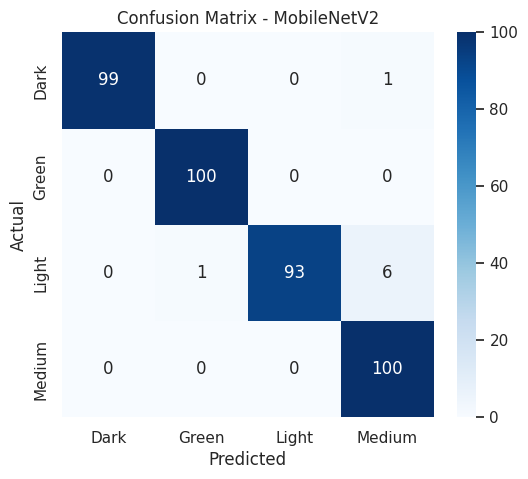

✅ Test Accuracy (MobileNetV2): 0.9800


In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# Predict on test set
y_pred_probs = model_b.predict(test_gen)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_gen.classes
class_labels = list(test_gen.class_indices.keys())

# Classification report
print("=== Transfer Learning Model Evaluation ===")
print(classification_report(y_true, y_pred, target_names=class_labels))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - MobileNetV2")
plt.show()

# Accuracy
acc_b = accuracy_score(y_true, y_pred)
print(f"Test Accuracy (MobileNetV2): {acc_b:.4f}")

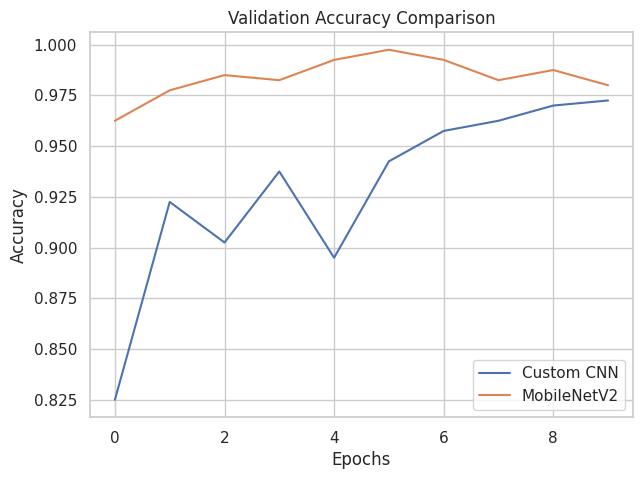

In [ ]:
plt.figure(figsize=(7,5))
plt.plot(history.history['val_accuracy'], label='Custom CNN')
plt.plot(history_b.history['val_accuracy'], label='MobileNetV2')
plt.title('Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step


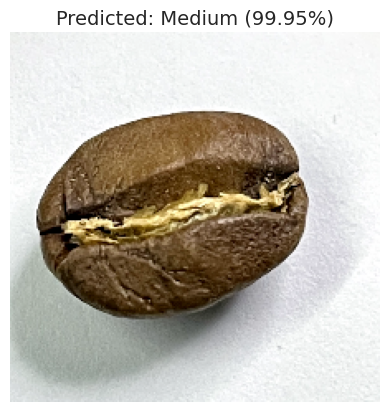

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from IPython.display import display, HTML
import random

test_dir = "/content/drive/MyDrive/BIGDATA/test"
class_labels = ['Dark', 'Green', 'Light', 'Medium']

roast_uses = {
    "Green": """
        <ul>
        <li>Home roasting</li>
        <li>Health products</li>
        <li>Storage/trade</li>
        <li>Professional evaluation</li>
        </ul>
    """,
    "Light": """
        <ul>
        <li>Pour-over</li>
        <li>Drip</li>
        <li>Cold brew (fruity)</li>
        <li>Cupping</li>
        </ul>
    """,
    "Medium": """
        <ul>
        <li>Drip</li>
        <li>French press</li>
        <li>Espresso (bright)</li>
        <li>Cold brew</li>
        <li>Breakfast blends</li>
        </ul>
    """,
    "Dark": """
        <ul>
        <li>Espresso</li>
        <li>Milk-based drinks</li>
        <li>Moka pot</li>
        <li>Turkish coffee</li>
        <li>Strong cold brew</li>
        </ul>
    """
}

def classify_random_image_mobilenet(test_dir, model, class_labels):
    roast_level = random.choice(class_labels)
    roast_path = os.path.join(test_dir, roast_level)

    files = [f for f in os.listdir(roast_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    img_file = random.choice(files)
    img_path = os.path.join(roast_path, img_file)

    img = image.load_img(img_path, target_size=(224, 224))  # MobileNetV2 expects 224x224
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # normalize

    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    predicted_label = class_labels[pred_idx]
    confidence = preds[0][pred_idx] * 100

    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Predicted: {predicted_label} ({confidence:.2f}%)", fontsize=14)
    plt.show()

    display(HTML(f"""
    <div style='background:#f5f9ff; padding:15px; border-left:5px solid #007acc; width:fit-content'>
      <h3>☕ Common Uses of <span style='color:#004d99'>{predicted_label}</span> Roast</h3>
      <div style='font-size:15px; color:#333'>{roast_uses[predicted_label]}</div>
    </div>
    """))

classify_random_image_mobilenet(test_dir, model_b, class_labels)

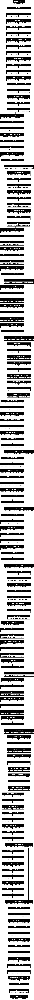

In [ ]:
from tensorflow.keras.utils import plot_model

# For CNN
plot_model(model, to_file='cnn_model.png', show_shapes=True, show_layer_names=True)

# For MobileNetV2
plot_model(model_b, to_file='mobilenetv2_model.png', show_shapes=True, show_layer_names=True)

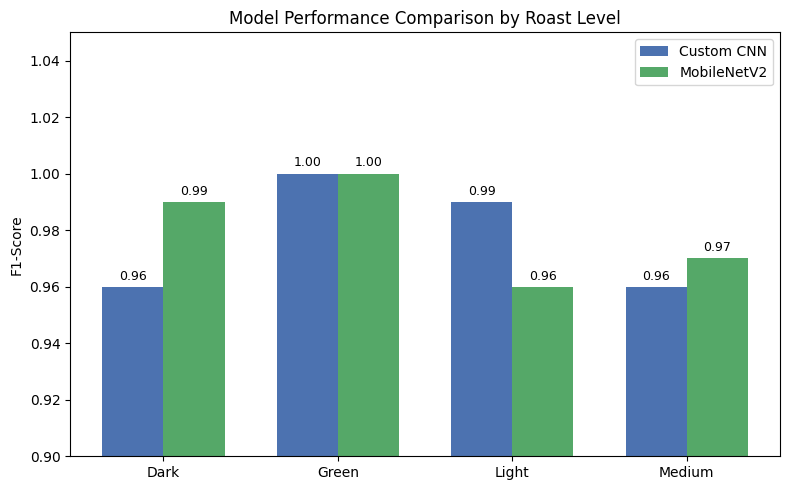

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Roast levels
labels = ['Dark', 'Green', 'Light', 'Medium']

# F1-scores from your results
cnn_f1 = [0.96, 1.00, 0.99, 0.96]
mobilenet_f1 = [0.99, 1.00, 0.96, 0.97]

x = np.arange(len(labels))  # label locations
width = 0.35  # width of the bars

fig, ax = plt.subplots(figsize=(8,5))
bars1 = ax.bar(x - width/2, cnn_f1, width, label='Custom CNN', color='#4C72B0')
bars2 = ax.bar(x + width/2, mobilenet_f1, width, label='MobileNetV2', color='#55A868')

# Labels and formatting
ax.set_ylabel('F1-Score')
ax.set_title('Model Performance Comparison by Roast Level')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylim(0.9, 1.05)
ax.legend()

# Annotate bars with values
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width()/2, height),
                    xytext=(0, 3), textcoords="offset points",
                    ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


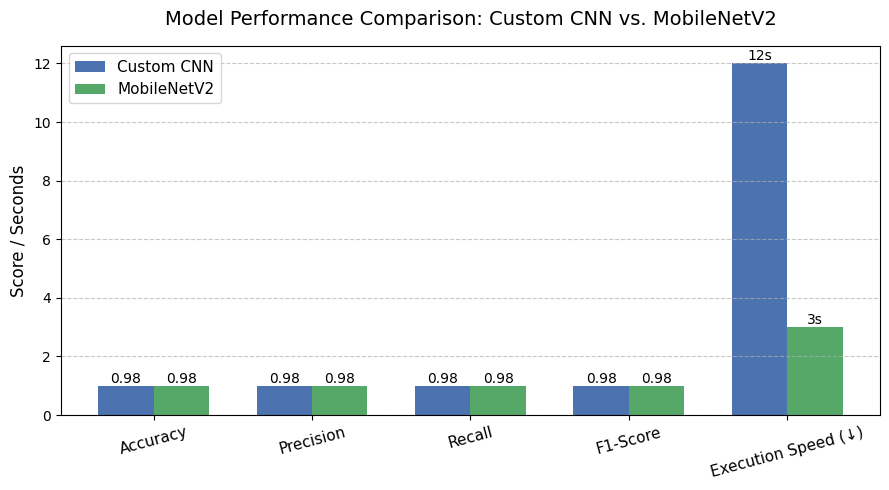

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# --- Hardcoded Metrics from Your Results ---
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Execution Speed (↓)']

# Values from your results
cnn_values = [0.98, 0.98, 0.98, 0.98, 12]     # Custom CNN (slower)
mobilenet_values = [0.98, 0.98, 0.98, 0.98, 3]  # MobileNetV2 (faster)

x = np.arange(len(metrics))
width = 0.35

# --- Create figure ---
fig, ax = plt.subplots(figsize=(9, 5))
bar1 = ax.bar(x - width/2, cnn_values, width, label='Custom CNN', color='#4C72B0')
bar2 = ax.bar(x + width/2, mobilenet_values, width, label='MobileNetV2', color='#55A868')

# --- Aesthetics ---
ax.set_ylabel('Score / Seconds', fontsize=12)
ax.set_title('Model Performance Comparison: Custom CNN vs. MobileNetV2', fontsize=14, pad=15)
ax.set_xticks(x)
ax.set_xticklabels(metrics, rotation=15, fontsize=11)
ax.legend(fontsize=11)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels on bars
for bars in [bar1, bar2]:
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f'{yval:.2f}' if yval <= 1 else f'{int(yval)}s',
                ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()